# Parse and Visualize Model Outputs

In [83]:
import re
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from tqdm import tqdm

In [2]:
matplotlib.rcParams['figure.dpi'] = 200

In [3]:
%matplotlib inline

# Read Codex Predictions

In [4]:
codex_lines = open('../outputs/gsm8k/train_codex_complex.txt').readlines()

In [5]:
len(codex_lines)

1036165

In [6]:
codex_lines[0]

'Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?\n'

In [7]:
codex_lines[1]

'Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.\n'

In [8]:
codex_lines[2]

'Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.\n'

In [9]:
codex_lines[3]

'#### 72\n'

In [10]:
codex_lines[4]

'Model output 0: \n'

In [11]:
codex_lines[5]

'If Natalia sold 48 clips in April, she sold 48/2 = 24 clips in May.\n'

In [12]:
codex_lines[6]

'In total, Natalia sold 48 + 24 = 72 clips in April and May.\n'

In [13]:
codex_lines[7]

'The answer is 72\n'

In [14]:
codex_lines[8]

'Per-step decode: <<\' step\'>> 1.0000 <<\'!\'>> 0.0000 <<\' stepped\'>> 0.0000 <<\' stepping\'>> 0.0000 <<\' step\'>> 1.0000 <<\' steps\'>> 0.0000 ||| <<\'\\n\'>> 0.9862 <<\'!\'>> 0.0002 <<\'.\'>> 0.0090 <<\'\\n\'>> 0.9862 <<\' \'>> 0.0010 <<\':\'>> 0.0025 ||| <<\'If\'>> 0.1009 <<\'If\'>> 0.1009 <<\'She\'>> 0.0416 <<\'The\'>> 0.0394 <<\'Nat\'>> 0.3286 <<\'In\'>> 0.2685 ||| <<\' Nat\'>> 0.6018 <<\' Nat\'>> 0.6018 <<\' in\'>> 0.0261 <<\' we\'>> 0.0125 <<\' 48\'>> 0.0335 <<\' she\'>> 0.2588 ||| <<\'alia\'>> 0.9968 <<\'ale\'>> 0.0001 <<\'ilia\'>> 0.0001 <<\'lia\'>> 0.0002 <<\' sold\'>> 0.0013 <<\'alia\'>> 0.9968 ||| <<\' sold\'>> 0.9573 <<\' sells\'>> 0.0217 <<\' sold\'>> 0.9573 <<\' is\'>> 0.0022 <<"\'s">> 0.0028 <<\' had\'>> 0.0024 ||| <<\' 48\'>> 0.4455 <<\' clips\'>> 0.3353 <<\' half\'>> 0.1318 <<\' to\'>> 0.0351 <<\' 48\'>> 0.4455 <<\' twice\'>> 0.0058 ||| <<\' clips\'>> 0.9248 <<\' clips\'>> 0.9248 <<\' friends\'>> 0.0062 <<\' to\'>> 0.0058 <<\' of\'>> 0.0109 <<\' in\'>> 0.0345 ||| 

In [15]:
codex_lines[9]

'Model output 1: \n'

# Parse Codex Funtion Definition

In [4]:
def parse_step_prob(p):
    assert("'<<'" not in p)
    p = p.split('<<')
    p_ = []
    # ans_end = 'false'
    for pi in p:
        if('>>' not in pi): continue
        if("'>>'" not in pi):
            pi = pi.split('>>')
            assert(len(pi) == 2)
        else: 
            pi = [pi[:-10], pi[-8:]]
            print(pi)
        tok = pi[0][1:-1].replace('\\n', '\n')
        prob = float(pi[1].strip())
        
        # if('answer' in tok): ans_end == "ready1"
        # if('is' in tok and ans_end == "ready1"): ans_end = "ready2"
        # if('Question' in tok and ans_end == "ready2"): ans_end = "true"
        # if(ans_end == "true"): break
        # print(tok, ans_end)
                
        p_.append((tok, prob))
    return p_

def parse_codex_outputs(lines):
    """Parse Codex outputs into question, answer, prediction, and per-step-probs
    
    TODO: ignore unstopped answer chunks
    TODO: compare
    """
    questions = []
    answers = []
    ans_pred = []
    per_step_prob = []
    mode = ""
    ans_list = None
    for li, l in tqdm(enumerate(lines), total=len(lines)):
        if(l.startswith('Question')):
            if(mode == 'm' or mode == 'none'):
                mode = 'none'
                continue
            q = l
            mode = 'q'
            if(ans_list is not None):
                ans_pred.append(ans_list)
                per_step_prob.append(prob_list)
            ans_list = []
            prob_list = []
        elif(l.startswith('Answer: ')):
            questions.append(q)
            a = [l]
            mode = 'a'
        elif(l.startswith('Model output')):
            if(l.startswith('Model output 0')):
                answers.append(''.join(a))
            mode = 'm'
            m = [l]
        elif(l.startswith('Per-step')):
            ans_list.append(''.join(m))
            mode = 'p'
            prob_list.append(l)
        else:
            if(mode == 'a'):
                a.append(l)
            elif(mode == 'm'):
                m.append(l)
            elif(mode == 'p'): 
                pass
            elif(mode == 'none'):
                pass
            else:
                print(mode)
                print(li)
                print(lines[li - 1])
                print(l)
                raise ValueError() 
    ans_pred.append(ans_list)
    per_step_prob.append(prob_list)
    
    per_step_prob_ = []
    for p in tqdm(per_step_prob): # p means one question
        p_ = []
        for i, pi in enumerate(p): # pi means one answer for one question
            if(i == 0): pi = pi.split('Per-step decode: ')[1] 
            pi = pi.split(' ||| ')
            pi_ = []
            ans_end = "false"
            for pij in pi: # pij means one step in one answer
                pij_ = parse_step_prob(pij)
                # print(pij_)
                if(len(pij_) == 0): continue
                
                if('answer' in pij_[0][0]): 
                    ans_end = "ready1"
                    # print(pij_[0][0], ans_end)
                if('is' in pij_[0][0]): 
                    # print(pij_[0][0], ans_end)
                    if(ans_end == "ready1"):
                        ans_end = "ready2"
                if('Question' in pij_[0][0] and ans_end == "ready2"): 
                    ans_end = "true"
                if(ans_end == "true"): break
                
                # print(pij_[0][0], ans_end, 'answer' in pij_[0][0])
                pi_.append(pij_)
            p_.append(pi_)
        per_step_prob_.append(p_)
    
    return questions, answers, ans_pred, per_step_prob_

In [52]:
questions_test, answers_test, ans_pred_test, per_step_prob_test = parse_codex_outputs(codex_lines[:60])

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 250.63it/s]


In [70]:
questions, answers, ans_pred, per_step_prob = parse_codex_outputs(codex_lines)

 27%|██████████████████████████████████▎                                                                                              | 661/2489 [01:25<01:20, 22.77it/s]

["'>>'", ' 0.0000 ']


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2489/2489 [03:54<00:00, 10.60it/s]


In [53]:
questions[0]

'Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?\n'

In [54]:
answers[0]

'Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.\nNatalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.\n#### 72\n'

In [55]:
ans_pred[0][0]

'Model output 0: \nIf Natalia sold 48 clips in April, she sold 48/2 = 24 clips in May.\nIn total, Natalia sold 48 + 24 = 72 clips in April and May.\nThe answer is 72\n'

# Read Flan-T5 Predictions

In [5]:
lines_flan_t5 = open('../outputs/gsm8k/train_flan_t5_complex_duplicate.txt').readlines()

In [6]:
lines_flan_t5[0]

'Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?\n'

In [7]:
lines_flan_t5[1]

'Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.\n'

In [9]:
lines_flan_t5[2]

'Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.\n'

In [10]:
lines_flan_t5[3]

'#### 72\n'

In [11]:
lines_flan_t5[4]

'Model output 0: <pad> In May she sold 48 / 2 = 24 more clips. Natalia sold 48 + 24 = 72 clips altogether in April and May. The answer is 72</s> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>\n'

In [12]:
lines_flan_t5[5].split(' ||| ')[0]

"Per-step decode: <<'▁In'>> 0.2814 <<'▁Nat'>> 0.5805 <<'▁In'>> 0.2814 <<'▁She'>> 0.0360 <<'▁First'>> 0.0167 <<'▁If'>> 0.0123 "

In [13]:
lines_flan_t5[5].split(' ||| ')[1]

"<<'▁May'>> 0.9398 <<'▁May'>> 0.9398 <<'▁April'>> 0.0486 <<'▁June'>> 0.0024 <<'▁may'>> 0.0020 <<'▁the'>> 0.0018 "

In [14]:
lines_flan_t5[5].split(' ||| ')[2]

"<<'▁she'>> 0.0379 <<','>> 0.5619 <<'▁Nat'>> 0.3961 <<'▁she'>> 0.0379 <<'▁'>> 0.0008 <<'▁Natalie'>> 0.0005 "

In [15]:
lines_flan_t5[5].split(' ||| ')[3]

"<<'▁sold'>> 0.9924 <<'▁sold'>> 0.9924 <<'▁bought'>> 0.0021 <<'▁sell'>> 0.0012 <<'▁also'>> 0.0011 <<'▁had'>> 0.0006 "

In [16]:
lines_flan_t5[6]

'Model output 1: <pad> Natalia sold 48 / 2 = 24 clips in May. In April and May, Natalia sold 48 + 24 = 72 clips. The answer is 72</s> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>\n'

# Parse Flan-T5 Function Definition

In [70]:
def parse_step_prob_flan(p):
    assert("'<<'" not in p)
    p = p.split('<<')
    p_ = []
    # ans_end = 'false'
    for pi in p:
        # print(p)
        if(">>" not in pi):
            # print('!!')
            # print(pi)
            continue
        # if('>>' not in pi): continue
        # if("'>>'" not in pi):
        #     pi = pi.split('>>')
        #     if(len(pi) != 2):
        #         print(p)
        #     assert(len(pi) == 2)
        # else: 
        # print(pi)
        pi = [pi[:-10], pi[-8:]]
        # print(pi)
        tok = pi[0][1:-1].replace('\\n', '\n')
        prob = float(pi[1].strip())
        
        # if('answer' in tok): ans_end == "ready1"
        # if('is' in tok and ans_end == "ready1"): ans_end = "ready2"
        # if('Question' in tok and ans_end == "ready2"): ans_end = "true"
        # if(ans_end == "true"): break
        # print(tok, ans_end)
                
        p_.append((tok, prob))
    return p_

def parse_flan_t5_outputs(lines):
    """Parse Flan-T5 outputs into question, answer, prediction, and per-step-probs
    
    TODO: ignore unstopped answer chunks
    TODO: compare
    """
    questions = []
    answers = []
    ans_pred = []
    per_step_prob = []
    mode = ""
    ans_list = None
    for li, l in tqdm(enumerate(lines), total=len(lines)):
        if(l.startswith('Question')):
            if(mode == 'm' or mode == 'none'):
                mode = 'none'
                continue
            q = l
            mode = 'q'
            if(ans_list is not None):
                ans_pred.append(ans_list)
                per_step_prob.append(prob_list)
            ans_list = []
            prob_list = []
        elif(l.startswith('Answer: ')):
            questions.append(q)
            a = [l]
            mode = 'a'
        elif(l.startswith('Model output')):
            if(l.startswith('Model output 0')):
                answers.append(''.join(a))
            mode = 'm'
            m = [l.replace('<pad>', '').strip()]
        elif(l.startswith('Per-step')):
            ans_list.append(''.join(m))
            mode = 'p'
            prob_list.append(l)
        else:
            if(mode == 'a'):
                a.append(l)
            elif(mode == 'm'):
                m.append(l)
            elif(mode == 'p'): 
                pass
            elif(mode == 'none'):
                pass
            else:
                print(mode)
                print(li)
                print(lines[li - 1])
                print(l)
                raise ValueError() 
    ans_pred.append(ans_list)
    per_step_prob.append(prob_list)
    
    per_step_prob_ = []
    for p in tqdm(per_step_prob): # p means one question
        p_ = []
        for i, pi in enumerate(p): # pi means one answer for one question
            if(i == 0): pi = pi.split('Per-step decode: ')[1] 
            pi = pi.split(' ||| ')
            pi_ = []
            
            for pij in pi: # pij means one step in one answer
                pij_ = parse_step_prob_flan(pij)
                if(len(pij_) > 0):
                    if('<pad>' in pij_[0][0]): break
                    pi_.append(pij_)
            p_.append(pi_)
        per_step_prob_.append(p_)
    
    return questions, answers, ans_pred, per_step_prob_

In [71]:
questions_flan, answers_flan, ans_pred_flan, per_step_prob_flan = parse_flan_t5_outputs(lines_flan_t5)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5190/5190 [01:16<00:00, 67.62it/s]


In [19]:
len(questions_flan), len(answers_flan), len(ans_pred_flan), len(per_step_prob_flan)

(5190, 5190, 5190, 5190)

In [25]:
questions_flan[0]

'Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?\n'

In [26]:
answers_flan[0]

'Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.\nNatalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.\n#### 72\n'

In [72]:
ans_pred_flan[0][0]

'Model output 0:  In May she sold 48 / 2 = 24 more clips. Natalia sold 48 + 24 = 72 clips altogether in April and May. The answer is 72</s>'

In [73]:
per_step_prob_flan[0][0]

[[('▁In', 0.2814),
  ('▁Nat', 0.5805),
  ('▁In', 0.2814),
  ('▁She', 0.036),
  ('▁First', 0.0167),
  ('▁If', 0.0123)],
 [('▁May', 0.9398),
  ('▁May', 0.9398),
  ('▁April', 0.0486),
  ('▁June', 0.0024),
  ('▁may', 0.002),
  ('▁the', 0.0018)],
 [('▁she', 0.0379),
  (',', 0.5619),
  ('▁Nat', 0.3961),
  ('▁she', 0.0379),
  ('▁', 0.0008),
  ('▁Natalie', 0.0005)],
 [('▁sold', 0.9924),
  ('▁sold', 0.9924),
  ('▁bought', 0.0021),
  ('▁sell', 0.0012),
  ('▁also', 0.0011),
  ('▁had', 0.0006)],
 [('▁48', 0.8291),
  ('▁48', 0.8291),
  ('▁half', 0.0909),
  ('▁1', 0.047),
  ('▁', 0.0076),
  ('▁2', 0.0054)],
 [('▁', 0.7878),
  ('▁', 0.7878),
  ('▁*', 0.1054),
  ('▁clips', 0.0973),
  ('▁clip', 0.0019),
  ('▁//', 0.0013)],
 [('/', 0.9964),
  ('/', 0.9964),
  ('x', 0.0032),
  ('<unk>', 0.0002),
  ('-', 0.0001),
  ("'", 0.0)],
 [('▁2', 0.9987),
  ('▁2', 0.9987),
  ('▁1', 0.0005),
  ('▁(2', 0.0002),
  ('▁two', 0.0001),
  ('▁(2)', 0.0001)],
 [('▁=', 0.9984),
  ('▁=', 0.9984),
  ('▁clips', 0.001),
  ('▁', 0

# Visualization Function Definition

In [81]:
def is_step_break(tok, before, after):
    if(tok == '\n'): return True
    else: 
        if(tok in [',', '.']):
            if(len(re.findall('[0-9]+', before)) == 0 and len(re.findall('[0-9]+', after)) == 0):
                return True
    return False

def vis_prob_flow(questions, answers, ans_pred, per_step_prob, qid, aid):
    print(questions[qid])
    print(answers[qid])
    print(ans_pred[qid][aid])
    
    probs = []
    tokens = []
    step_breaks = []
    j = 0
    for i, tp in enumerate(per_step_prob[qid][aid]):
        if(len(tp) == 0): continue
        if(i < 2 and ('step' in tp[0][0] or '\n' in tp[0][0])): continue
        tok = tp[0][0]
        if(i > 0): before = per_step_prob[qid][aid][i - 1][0][0]
        else: before = ''
        if(i < len(per_step_prob[qid][aid]) - 1): after = per_step_prob[qid][aid][i + 1][0][0]
        else: after = 0 
        if(is_step_break(tok, before, after)): step_breaks.append(j)
        tok = tok.replace("$", "\\$").replace('\n', '\\n')
        tokens.append(tok)
        probs.append(tp[0][1])
        j += 1
    
    cmap_mpl = plt.get_cmap("YlGnBu")
    
    fig, ax = plt.subplots()
    r = 0.3
    fig.set_size_inches(r * len(tokens), 3.5, forward=True)
    ax.bar(np.arange(len(tokens)), np.array(probs), color=cmap_mpl(probs))
    ax.axhline(y=0.5, color='tomato', linestyle="-.")
    for b in step_breaks: ax.axvline(x=b+0.5, color='tomato')
    
    plt.xticks(ticks=np.arange(len(tokens)), labels=tokens, fontsize=10, rotation=60)
    plt.show()
    return 

In [38]:
def visualize(questions, answers, ans_pred, per_step_prob, qid, aid):
    probs = []
    tokens = []
    for tp in per_step_prob[qid][aid]:
        if(len(tp) == 0): continue
        # TODO: rank prob
        tp0 = tp[0]
        tp1 = list(tp[1:])
        tp1.sort(key=lambda x:x[1], reverse=True)
        tp_ = [tp0]
        tp_.extend(tp1)

        prob = [p[1] for p in tp_]
        token = [t[0] for t in tp_]
        if(len(prob) != 6):
            print(tp)
            continue
        probs.append(prob)
        tokens.append(token)
    
    print(questions[qid])
    print(answers[qid])
    print(ans_pred[qid][aid])

    probs = np.array(probs)

    T = len(probs)

    fig, ax = plt.subplots()
    r = 0.8
    fig.set_size_inches(r * 6, r * T, forward=True)
    # TODO: resize figure according to sentence length

    im = ax.imshow(probs[:T] + 0.2, aspect=0.2, cmap="YlGnBu")

    for i in range(T):
        for j in range(6):
            tok = tokens[i][j]
            if(tok == "\n"): tok = "\\n"
            if(tok == "\n\n"): tok = "\\n\\n"
            tok = tok.replace("$", "\\$")
            if(probs[i, j] < 0.5): color="grey"
            else: color="whitesmoke"
            text = ax.text(j, i, 
                            # tokens[i][j],
                            tok + '   '+ str(probs[i, j]),
                            ha="center", va="center", color=color, fontsize=5)
            if(tokens[i][j] == "\n" and j == 0):
                text = ax.text(j - 0.7, i, 
                            ">>",
                            ha="center", va="center", color="dimgray", fontsize=6)
    plt.tick_params(left=False, labelleft = False)
    plt.show()
    return 

In [76]:
len(questions)

2489

# Codex Draw Per-Token Heatmap 

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 3: 
The monster eats a ship every hundred years, so over three hundred years it eats three ships.
The total number of people eaten is 847.
If each new ship has twice as many people as the last ship, then the

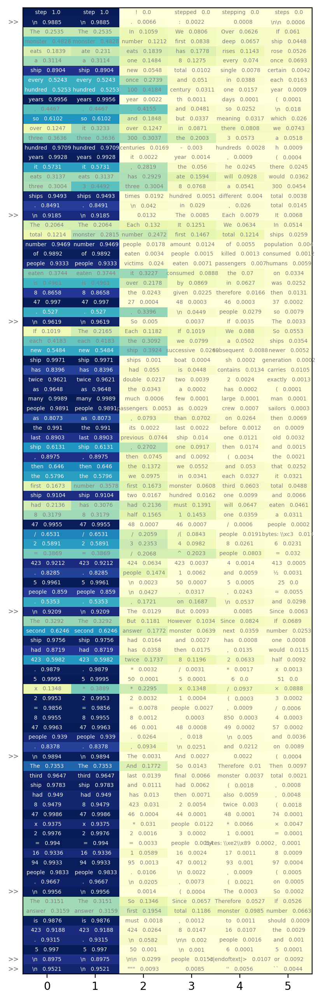

In [98]:
visualize(questions, answers, ans_pred, per_step_prob, 10, 3)

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 10: 
The monster rises from the water every 100 years to feast on a ship.
The first ship it ate was in the first 100 years.
The second ship it ate was in the second hundred years.
The third ship it ate was i

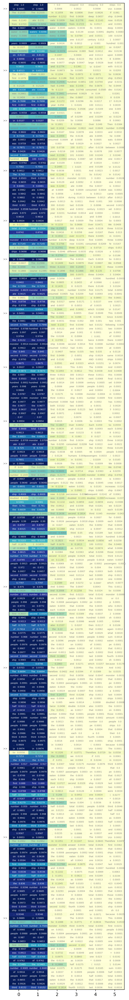

In [99]:
visualize(questions, answers, ans_pred, per_step_prob, 10, 10)

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 0: 
Tobias mows 4 lawns, so he earned 4 * $15 = $60 from mowing lawns.
He also shoveled driveways, earning $7 per driveway.
He earned $60 + $7 * x = $95, where x is the number of driveways he shoveled.
So, $7 * x = $95 - $60 = $35.
Then, x = $35 / $7 = 5 driveways.
The answer is 5



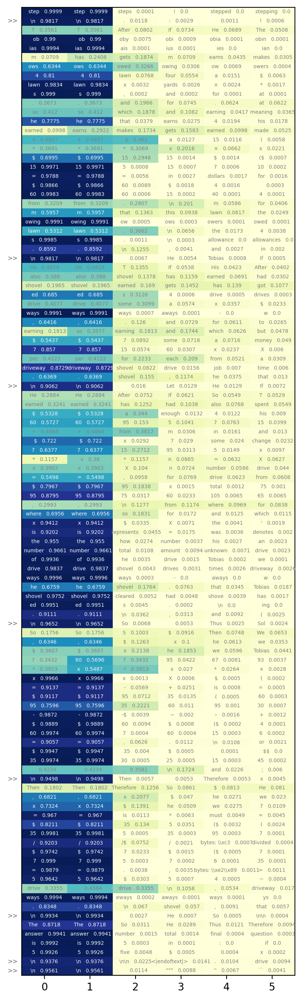

In [101]:
visualize(questions, answers, ans_pred, per_step_prob, 11, 0)

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 7: 
John uses the heating pad for 3 times a week for 2 weeks.
That means he uses the pad for 3 * 2 = 6 times in total.
He buys the heating pad for $30.
So, he spends $30/6 = $5 on each use.
The answer is 5



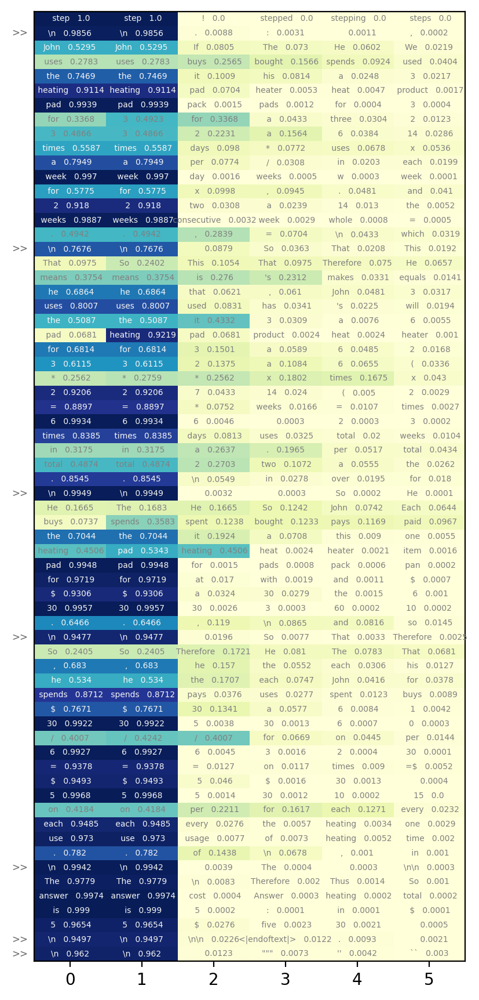

In [105]:
visualize(questions, answers, ans_pred, per_step_prob, 1000, 7)

# Codex Draw Probability Flow

Current impression:
* In step transition ("\\n"), calculation ("10 + 25 = 35"), preposition ("in", "on"), and other sentence splitters (","), the certainty is low
* The overall certainty is steadily increase as the model decode towards the end step, this is why it is hard to correct in the middle (easy to correct at the beginning, hardest to correct at the end)

## Wrong case 1

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 1: 
John uses the heating pad 3 times a week for 2 weeks, which is 3 * 2 * 7 = 42 total uses.
If he spends $30 on the heating pad, then the cost of the heating pad is $30/42 = $0.71.
The answer is 0.71



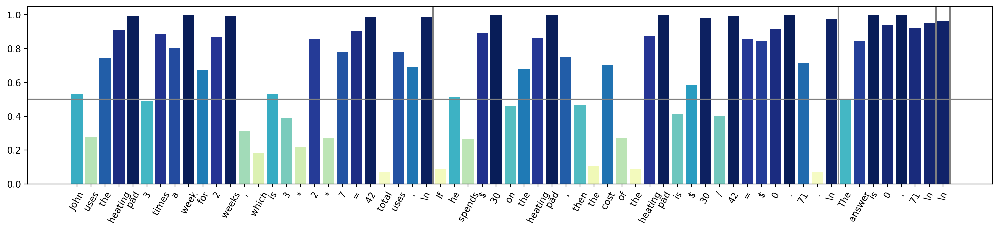

In [148]:
vis_prob_flow(questions, answers, ans_pred, per_step_prob, 1000, 1)

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 0: 
John uses the heating pad 3 times a week for 2 weeks.
This is a total of 3 times a week x 2 weeks = 6 uses.
The price per use is $30 / 6 = $5.
The answer is 5



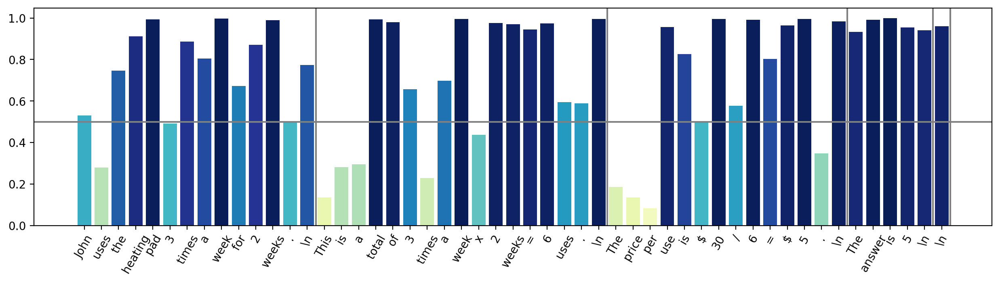

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 1: 
John uses the heating pad 3 times a week for 2 weeks, which is 3 * 2 * 7 = 42 total uses.
If he spends $30 on the heating pad, then the cost of the heating pad is $30/42 = $0.71.
The answer is 0.71



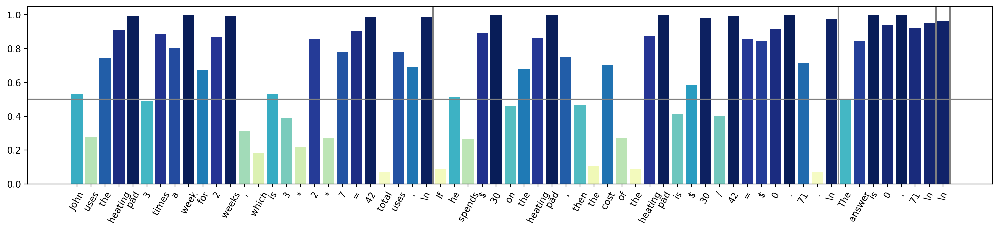

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 2: 
John uses the heating pad for 3 times a week for 2 weeks.
3 times a week for 2 weeks is 3 * 2 = 6 uses.
John paid $30 for the heating pad and used it 6 times.
Therefore, he spent 30/6 = $5 per use.
The answer is 5



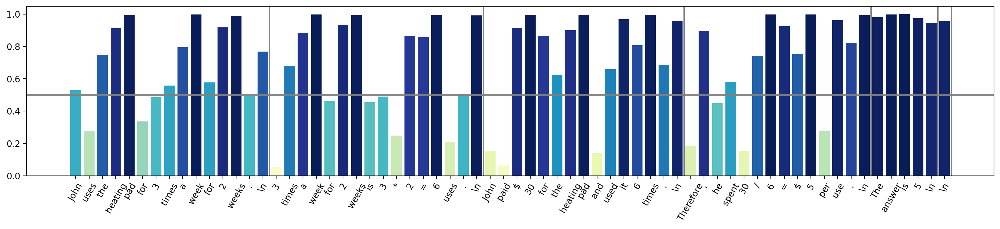

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 3: 
John bought the heating pad for $30.
He used it 3 times a week for 2 weeks.
A week has 7 days.
So, he used it 3 x 7 x 2 = 42 times.
Therefore, he spent $30/42 = $0.71 on each use.
The answer is 0.71



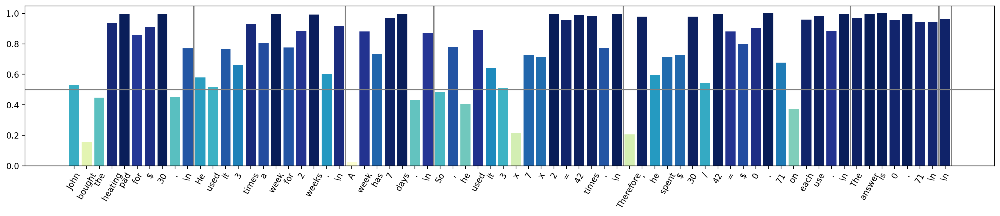

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 4: 
John uses the heating pad 3 times a week for 2 weeks, or 2 x 3 = 6 times a week.
He uses the heating pad for 6 x 2 = 12 weeks.
So he spends $30 for 12 uses.
The cost of each use is $30/12 = $2.50
The answer is 2.5



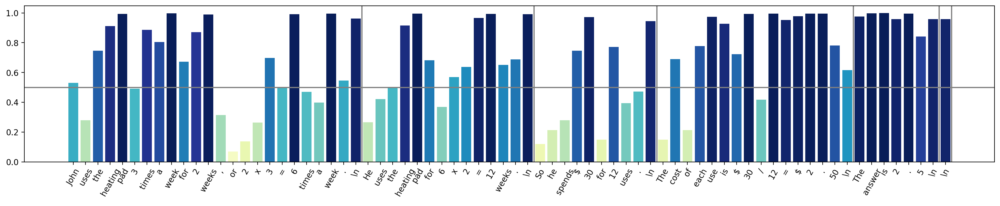

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 5: 
John spent $30 on the heating pad.
He used it 3 times a week for 2 weeks.
Which means he used it 3 times a week for 14 days (2 weeks).
So, he used it 3 times a week x 14 days = 42 times.
So, he spent $30/42 = $0.71 each use.
The answer is 0.71



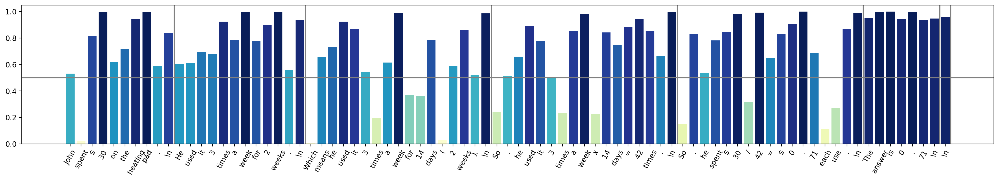

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 6: 
John uses the heating pad for 3 times a week for 2 weeks, so he uses the heating pad for 3*2=6 times in total.
John bought the heating pad for $30, so the cost of each use is $30/6=$5
The answer is 5



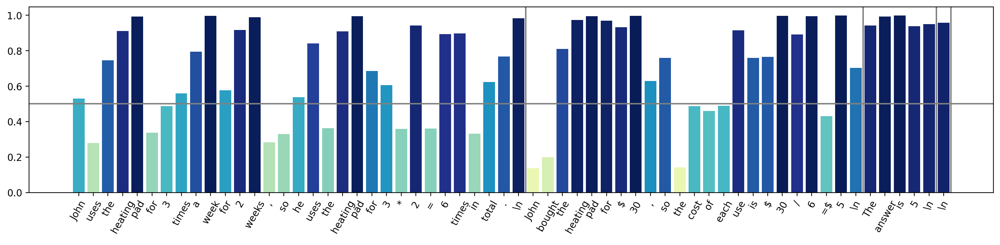

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 7: 
John uses the heating pad for 3 times a week for 2 weeks.
That means he uses the pad for 3 * 2 = 6 times in total.
He buys the heating pad for $30.
So, he spends $30/6 = $5 on each use.
The answer is 5



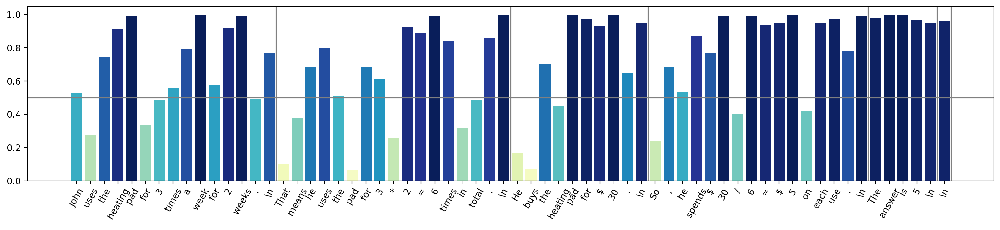

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 8: 
John buys the heating pad for $30
He uses it 3 times a week for 2 weeks
So, he uses it 3 times a week for 2 weeks x 2 weeks = 4 weeks
He uses it a total of 3 times a week x 4 weeks = 12 times
So, he spends $30 / 12 = $2.50
The answer is 2.5



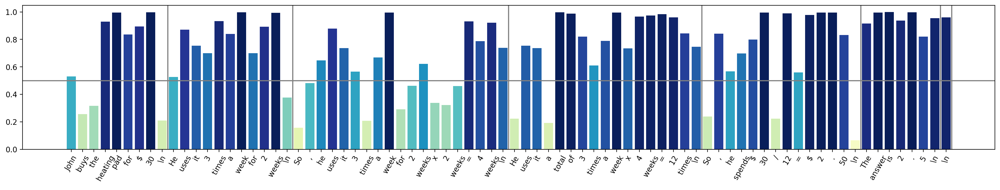

Question 1000: John buys a heating pad for $30.  He uses it 3 times a week for 2 weeks.  How much does he spend on each use?

Answer: He uses it 3*2=<<3*2=6>>6 times
So he pays 30/6=$<<30/6=5>>5
#### 5

Model output 9: 
John uses the heating pad for 3 times a week for 2 weeks.
This is 3 times a week x 2 weeks = 6 uses.
He spent $30 for the heating pad.
This means he spent $30/6 = $5 for each use.
The answer is 5



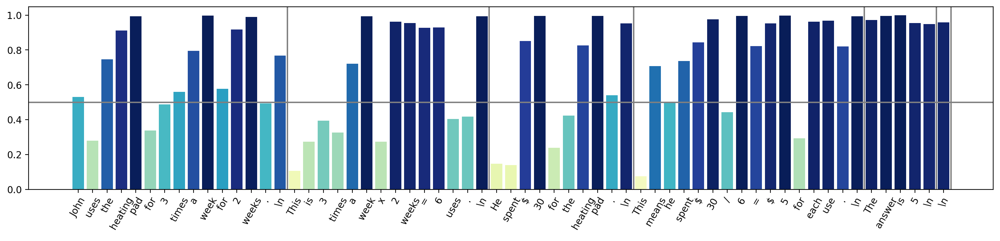

In [155]:
for i in range(10):
    vis_prob_flow(questions, answers, ans_pred, per_step_prob, 1000, i)

## Wrong Case 2

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 0: 
The first ship had P people on it, and the second ship had 2P people on it, and the third ship had 2*2P people on it.
The monster ate 847 people over these three ships, so 847 = P + 2P + 4P = 7P.
Then P 

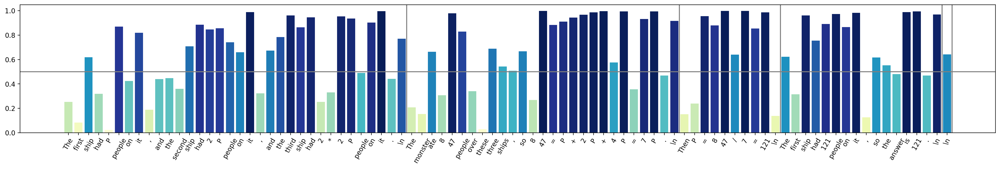

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 1: 
The monster has eaten a total of 847 people in 300 years.
So, in the first hundred years, it ate 847/3 = 282 people.
Each new ship has twice as many people as the last ship.
Hence, the number of people o

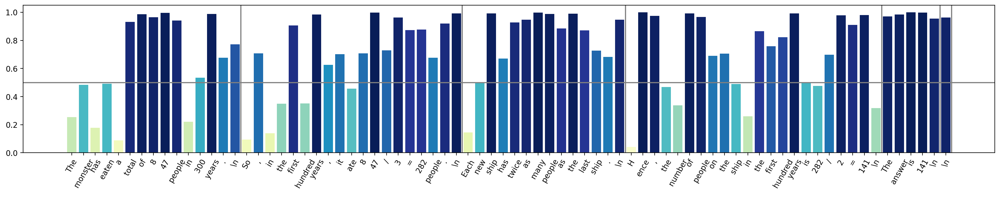

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 2: 
The monster has eaten 847 people over 300 years, so it has eaten 847/300 = 2.8 people per year.
Therefore, it has eaten 2.8 people per year for 100 years, so it has eaten 2.8 x 100 = 280 people in the fi

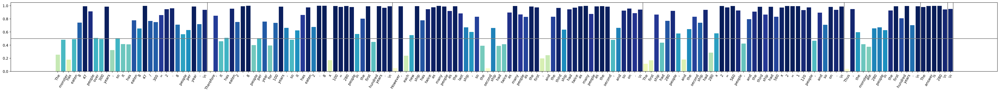

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 3: 
The monster eats a ship every hundred years, so over three hundred years it eats three ships.
The total number of people eaten is 847.
If each new ship has twice as many people as the last ship, then the

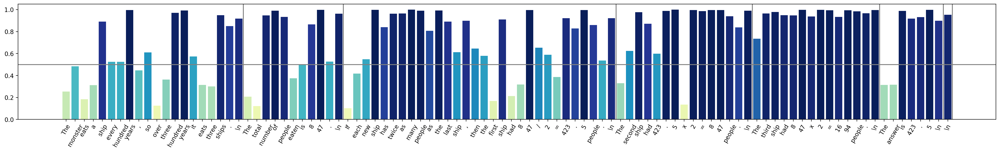

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 4: 
The monster ate 847 people in 300 years, so it ate 847/300 = 2.8 people per year.
It ate 2.8 people per year for 100 years, so it ate 2.8 * 100 = 280 people in the first hundred years.
Each ship has twic

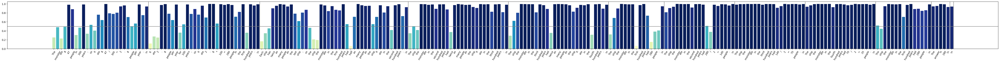

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 5: 
The monster has eaten 847 people over 3 hundred years.
Since each century has 100 years, we can divide 847 by 3 to find the people eaten in one century.
Therefore, 847/3 = 282 people were eaten in one ce

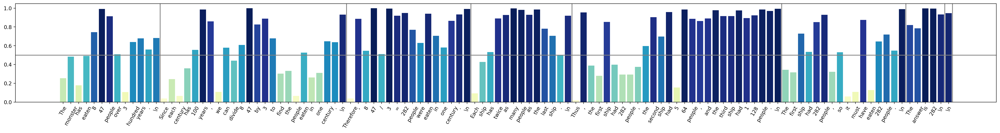

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 6: 
The monster has eaten 847 people over 300 years, so it has eaten 847/300 = 2.8 people per year.
The first ship was eaten in the first 100 years, so it ate 2.8 * 100 = 280 people.
The second ship was eate

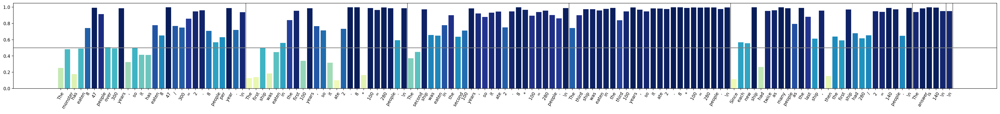

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 7: 
The number of people on the first ship is x.
The number of people on the second ship is 2x.
The number of people on the third ship is 2(2x) = 4x.
The number of people on the fourth ship is 2(4x) = 8x.
Th

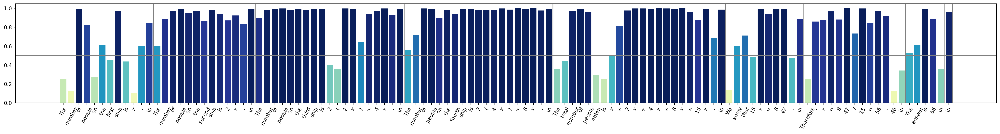

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 8: 
The monster ate 847 people over 300 years, so each hundred years it ate 847/3 = 282 people.
We are told that each new ship has twice as many people as the last ship, so we can imagine the ships as a sequ

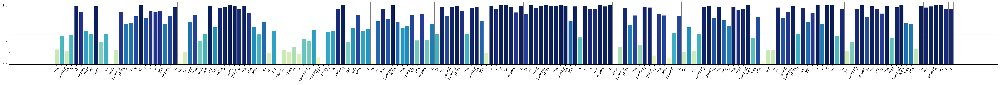

Question 10: A deep-sea monster rises from the waters once every hundred years to feast on a ship and sate its hunger. Over three hundred years, it has consumed 847 people. Ships have been built larger over time, so each new ship has twice as many people as the last ship. How many people were on the ship the monster ate in the first hundred years?

Answer: Let S be the number of people on the first hundred years’ ship.
The second hundred years’ ship had twice as many as the first, so it had 2S people.
The third hundred years’ ship had twice as many as the second, so it had 2 * 2S = <<2*2=4>>4S people.
All the ships had S + 2S + 4S = 7S = 847 people.
Thus, the ship that the monster ate in the first hundred years had S = 847 / 7 = <<847/7=121>>121 people on it.
#### 121

Model output 9: 
The ship that was eaten in the first hundred years had the fewest number of people on it.
The monster has eaten 847 people in 300 years.
If the number of people on each ship has doubled, then the number 

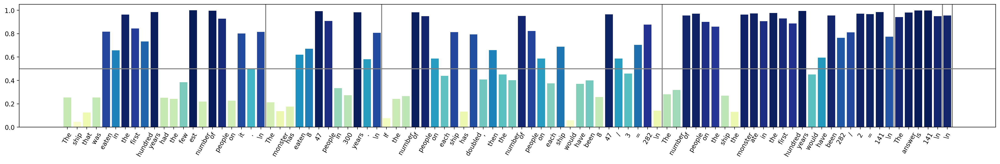

In [158]:
for i in range(10):
    vis_prob_flow(questions, answers, ans_pred, per_step_prob, 10, i)

## Wrong Case 3

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 0: 
Tobias mows 4 lawns, so he earned 4 * $15 = $60 from mowing lawns.
He also shoveled driveways, earning $7 per driveway.
He earned $60 + $7 * x = $95, where x is the number of driveways he shoveled.
So, $7 * x = $95 - $60 = $35.
Then, x = $35 / $7 = 5 driveways.
The answer is 5



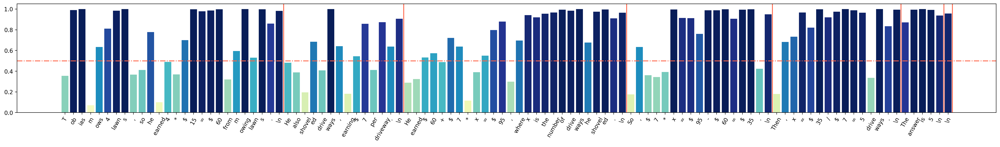

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 1: 
If Tobias gets $5 a month and he has been saving up for the past three months, then he has $5 * 3 = $15.
If he mows 4 lawns and charges $15 for each lawn, then he has $15 * 4 = $60.
If he shovels driveways and charges $7 for each driveway, then he has $7 * x = $95 - $15 - $15 - $60 = $10.
Therefore, h

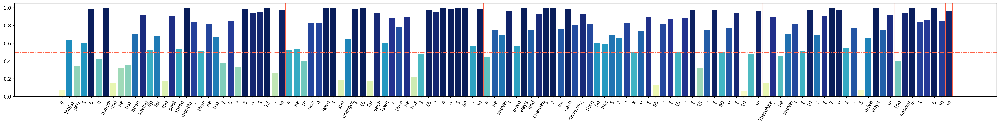

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 2: 
Tobias has been saving up for three months, so he has $5 * 3 = $15 in allowance.
He mowed 4 lawns and charged $15 per lawn, so he made $15 * 4 = $60 from mowing.
He shoveled x driveways and charged $7 per driveway, so he made $7 * x = $7x from shoveling.
The total amount of money he made was $15 + $60

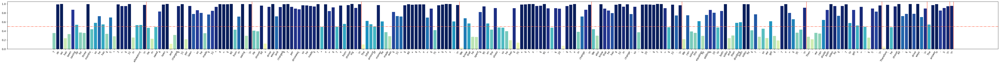

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 3: 
Tobias mows 4 lawns, so he earns 4 * $15 = $60.
He shovels driveways, so he earns $7 per driveway.
He has $15 in change.
Let's assume he shoveled x driveways.
Then he earned x * $7 = $7x.
He also earned $5 per month for 3 months, so he earned $5 * 3 = $15.
He also had $95 to spend on the shoes, so he 

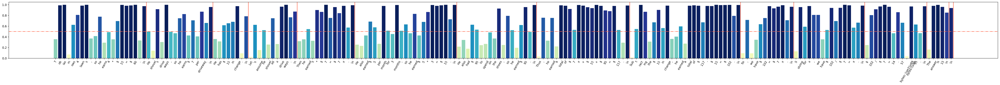

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 4: 
Tobias has $5 allowance per month.
In three months, he has $5 * 3 = $15 from his allowance.
Tobias charges $15 to mow a lawn.
He has mowed 4 lawns, so he has earned $15 * 4 = $60.
Tobias charges $7 to shovel a driveway.
He has $15 in change after buying the shoes.
If he has $15 in change after buying 

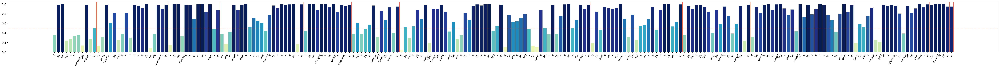

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 5: 
Tobias has saved up $5 x 3 = $15 from his allowance over the past three months.
He has mowed 4 lawns for $15 each, so he has earned $15 x 4 = $60 from mowing lawns.
He has earned $60 + $15 = $75 from mowing lawns and his allowance.
He has $95 - $75 = $20 left to pay for the shoes.
He has $15 in change

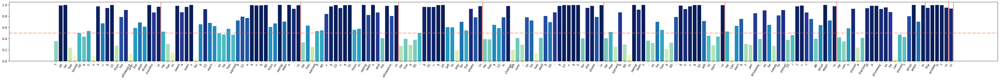

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 6: 
Tobias has $95 to buy his new shoes.
He has $5 a month for 3 months, so he has $5*3 = $15 from his allowance.
He mowed 4 lawns, so he has $15*4 = $60 from mowing lawns.
He shoveled x driveways and earned $7*x = $7x
He has $95 - $15 - $60 - $7x = $15
$15 = $95 - $15 - $60 - $7x
$15 = $95 - $75 - $7x
$1

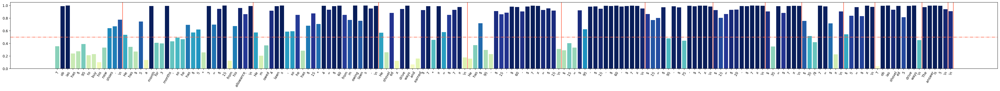

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 7: 
Tobias gets $5 allowance a month, and he has been saving up his money for the past three months.
It means that he has $5 x 3 = $15 in total.
He charges $15 to mow a lawn and $7 to shovel.
If he mows 4 lawns, he will get 4 * $15 = $60.
He also has $15 in change after buying the shoes, so he has $60 + $

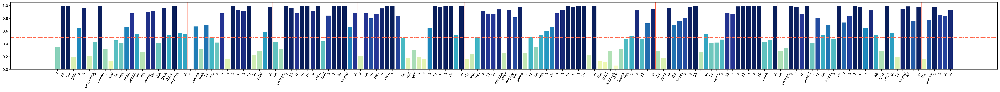

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 8: 
Tobias has $5 allowance a month, so after 3 months he has 3 x 5 = $15.
He charges $15 to mow a lawn and $7 to shovel.
He mowed 4 lawns, so he earned 4 x 15 = $60.
He has $15 in change, so he spent $95 - $15 = $80.
He earned $60 from mowing lawns and $15 from allowance, so he earned $60 + $15 = $75 in 

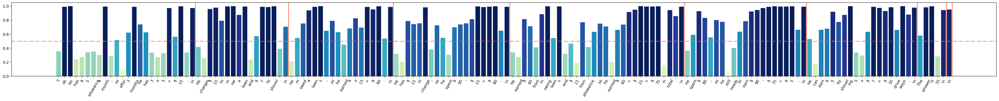

Question 11: Tobias is buying a new pair of shoes that costs $95. He has been saving up his money each month for the past three months. He gets a $5 allowance a month. He also mows lawns and shovels driveways. He charges $15 to mow a lawn and $7 to shovel. After buying the shoes, he has $15 in change. If he mows 4 lawns, how many driveways did he shovel?

Answer: He saved up $110 total because 95 + 15 = <<95+15=110>>110
He saved $15 from his allowance because 3 x 5 = <<3*5=15>>15
He earned $60 mowing lawns because 4 x 15 = <<4*15=60>>60
He earned $35 shoveling driveways because 110 - 60 - 15 = <<110-60-15=35>>35
He shoveled 5 driveways because 35 / 7 = <<35/7=5>>5
#### 5

Model output 9: 
Tobias has been saving his money for three months, so he has 3 * $5 = $15 in his piggy bank.
Tobias mows 4 lawns and charges $15 for each lawn, so he earns 4 * $15 = $60.
He shovels driveways and charges $7 for each driveway, so he earns $7 * x = $60.
Therefore, x = $60 / $7 = 8.57.
He can't shovel 8.

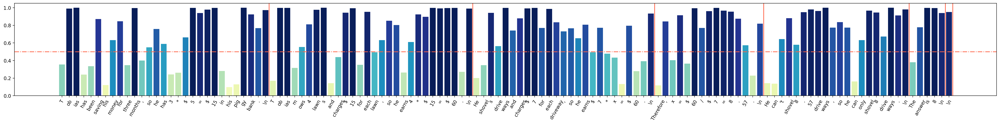

In [164]:
for i in range(10):
    vis_prob_flow(questions, answers, ans_pred, per_step_prob, 11, i)

## Correct Case 1

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 0: 
If Natalia sold 48 clips in April, she sold 48/2 = 24 clips in May.
In total, Natalia sold 48 + 24 = 72 clips in April and May.
The answer is 72



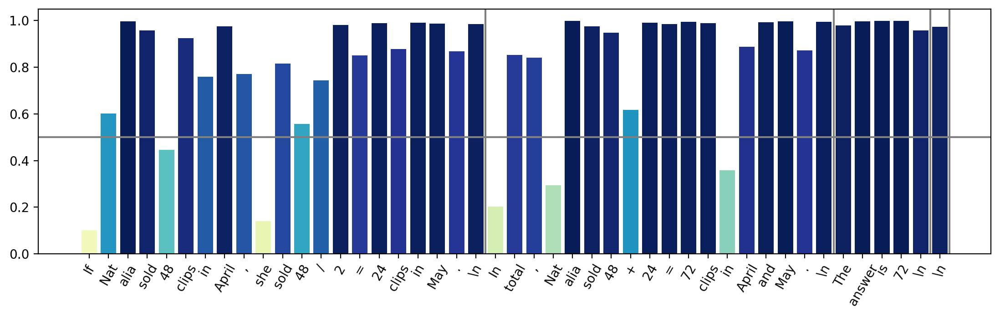

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 1: 
Natalia sold 48 clips in April.
She sold half as many clips in May, so she sold 24 clips in May.
The total number of clips she sold in both April and May is 48 + 24 = 72.
The answer is 72



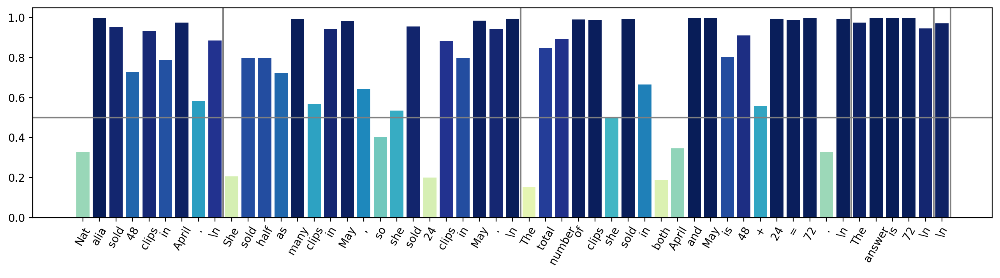

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 2: 
Natalia sold 48 clips in April, and half as many in May, so she sold 48/2 = 24 clips in May
Natalia sold 48+24 = 72 clips in total in April and May
The answer is 72



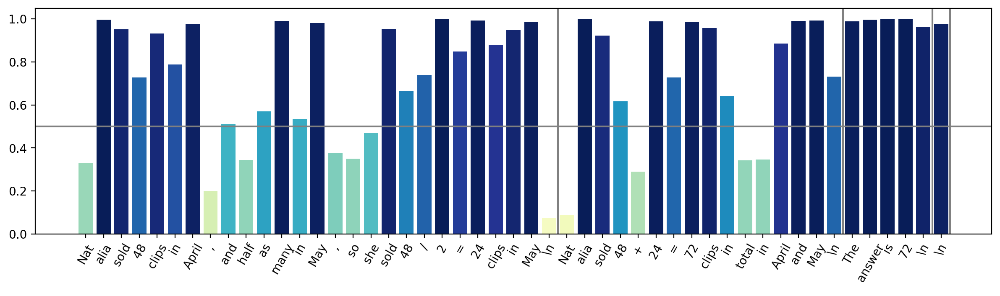

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 3: 
Natalia sold 48 clips to her friends in April.
In May, she sold half as many clips, which is 48/2 = 24.
The total number of clips she sold in April and May is 48 + 24 = 72.
The answer is 72



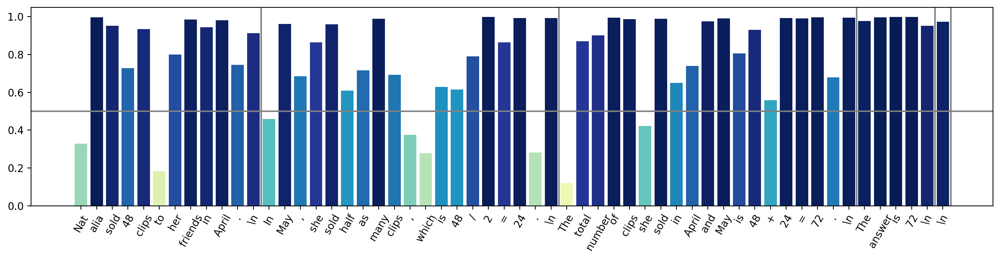

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 4: 
Natalia sold 48 clips in April.
In May, she sold half as many, so 48/2 = 24 clips.
The total number of clips Natalia sold in April and May is 48 + 24 = 72 clips.
The answer is 72



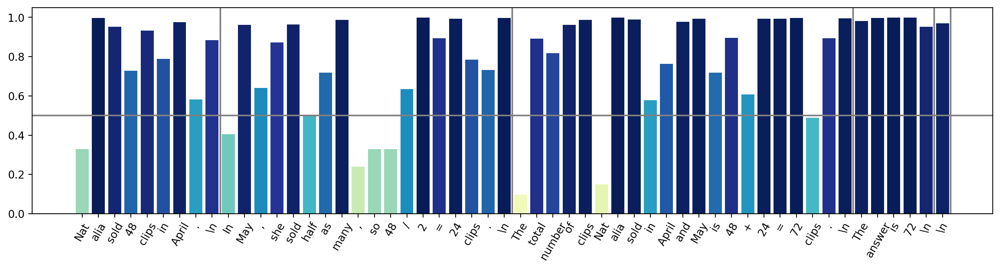

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 5: 
Natalia sold 48 clips in April and half as many in May, so she sold 48/2 = 24 clips in May.
Therefore, she sold 48 + 24 = 72 clips in total.
The answer is 72



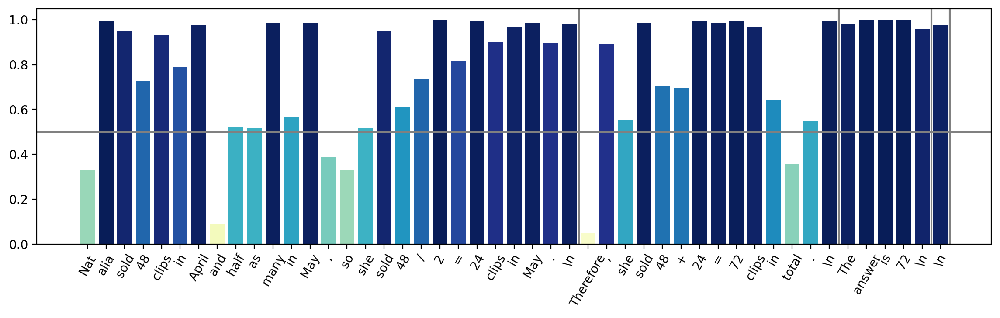

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 6: 
Natalia sold 48 clips in April.
In May, she sold half as many clips, so 48/2 = 24 clips.
In total, she sold 48+24 = 72 clips.
The answer is 72



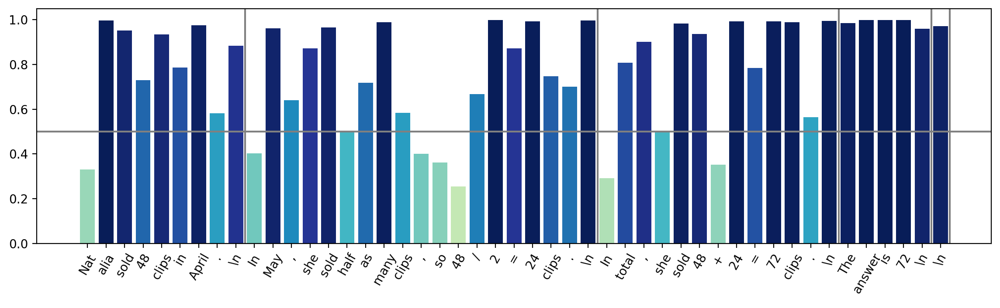

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 7: 
Natalia sold 48 clips in April.
In May, she sold half of 48 = 24 clips.
Therefore, the total number of clips sold by Natalia in April and May is 48 + 24 = 72.
The answer is 72



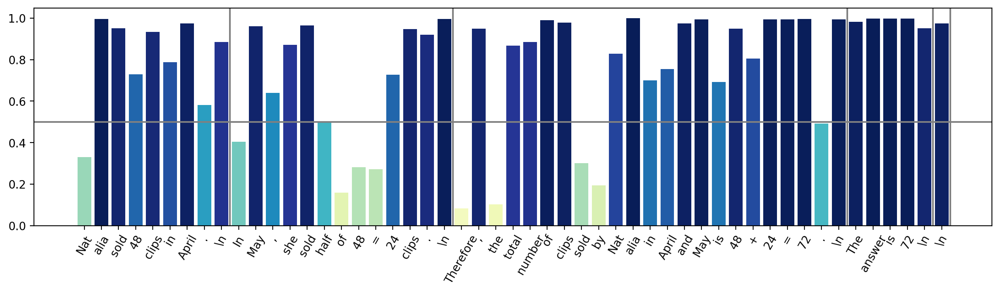

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 8: 
Natalia sold 48 clips in April.
In May, she sold 48/2 = 24 clips.
The total number of clips she sold in April and May is 48+24 = 72.
The answer is 72



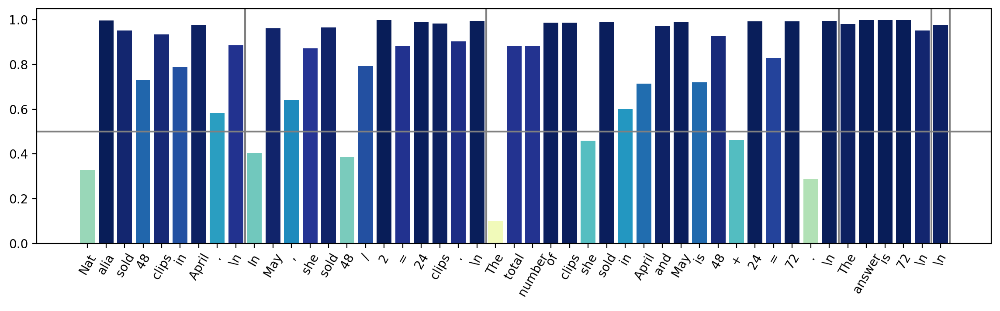

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 9: 
Natalia sold 48 clips in April.
In May, she sold 48/2 = 24 clips.
In total, she sold 48 + 24 = 72 clips.
The answer is 72



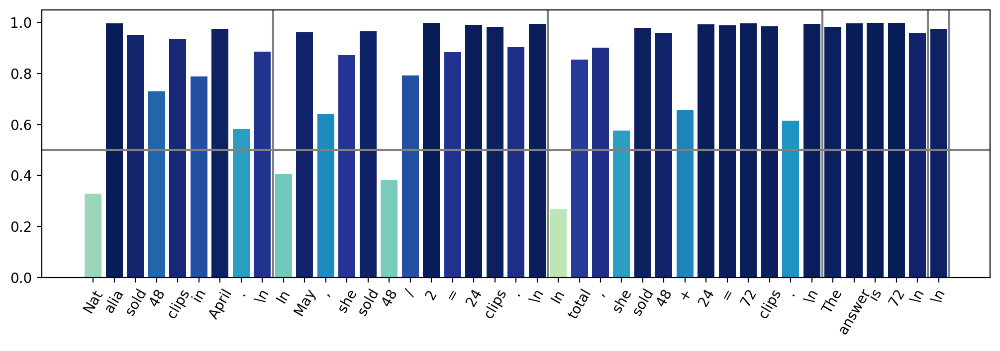

In [156]:
for i in range(10):
    vis_prob_flow(questions, answers, ans_pred, per_step_prob, 0, i)

## Correct Case 2

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 0: 
Weng earns $12 for every hour of babysitting.
She babysat for 50 minutes.
50 minutes is less than an hour, so she earned less than $12.
She earned $12/60 * 50 = $10.
The answer is 10



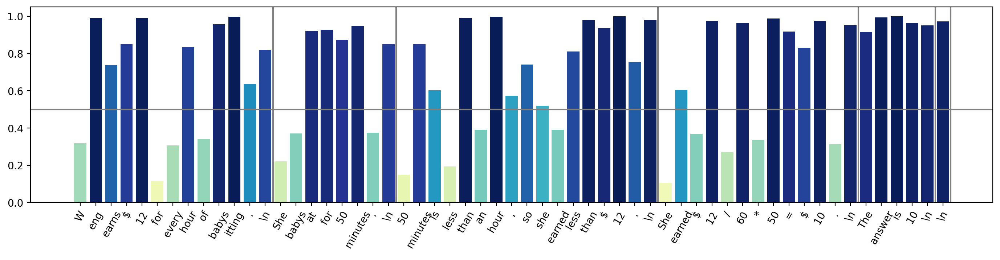

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 1: 
Weng earns $12 per hour.
She earned $12 for the first hour.
She earned $12 for the second hour.
She earned $12 for the third hour.
She earned $12 for the fourth hour.
She earned $12 for the fifth hour.
She earned $12 for the sixth hour.
She earned $12 for the seventh hour.
She earned $12 for the eighth hour.
She earned $12 for the ninth hour.
She earned $12 for the tenth hour.
She earned $12 for the eleventh hour.
She earned $12 for the twelfth hour.
She earned $12 for the thirteenth hour.
She earned $12 for the fourteenth hour.
She earned $12 for the fifteenth hour.
She earned $12 for the sixteenth hour.
She earned $12 for the seventeenth hour.
She earned $12 for the eighteenth hour.
She earned $12 for the nineteenth ho

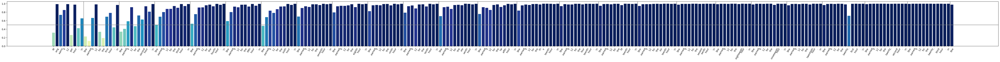

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 2: 
Since Weng earns $12 an hour, she will earn $12 for each hour she babysits.
Since she babysat for 50 minutes, she can take 50 minutes and convert it to hours.
50 minutes is equal to 50/60 hours = 0.833 hours.
If she earned $12 an hour, she would earn $12 * 0.833 = $10.
The answer is 10



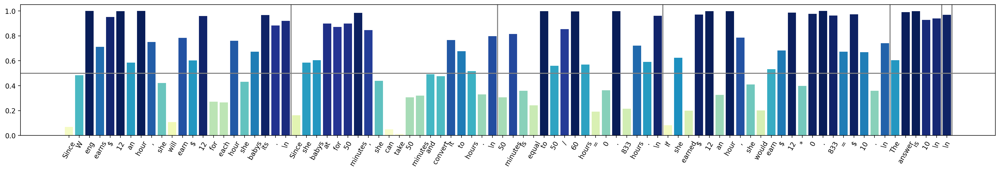

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 3: 
Weng earns $12 an hour.
She worked for 50 minutes.
There are 60 minutes in an hour.
So, she worked for 50/60 hours.
She earned $12 * 50/60 = $10
The answer is 10



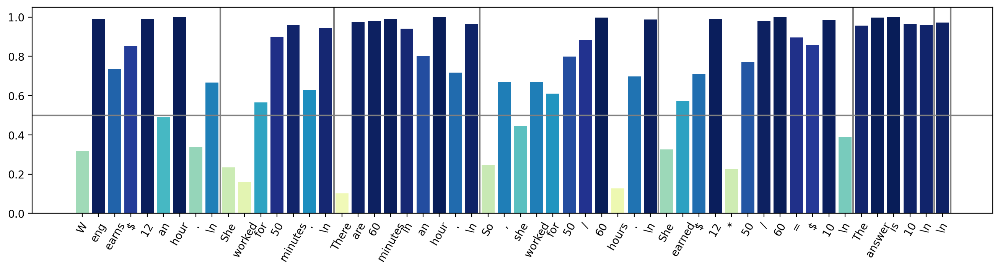

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 4: 
If Weng earns $12 an hour, then she would earn $12 * 1 = $12 for 1 hour.
If she earns $12 for 1 hour, then she would earn $12 * 2 = $24 for 2 hours.
If she earns $24 for 2 hours, then she would earn $24 * 3 = $72 for 3 hours.
If she earns $72 for 3 hours, then she would earn $72 * 4 = $288 for 4 hours.
If she earns $288 for 4 hours, then she would earn $288 * 5 = $1440 for 5 hours.
If she earns $1440 for 5 hours, then she would earn $1440 * 6 = $8640 for 6 hours.
If she earns $8640 for 6 hours, then she would earn $8640 * 7 = $60480 for 7 hours.
If she earns $60480 for 7 hours, then she would earn $60480 * 8 = $483840 for 8 hours.
If she earns $483840 for 8 hours, then she would earn $483840 * 9 = $4354560 for 9 hours.
I

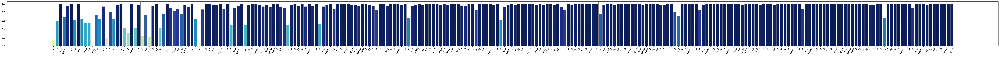

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 5: 
Weng earns $12 per hour.
She babysat for 50 minutes, which is less than an hour.
So, she earned less than $12.
50 minutes is less than 1 hour, so we need to find out how much less than $12 she earned.
Since there are 60 minutes in an hour, 1 hour = 60 minutes.
This means that 1 minute is 1/60 of an hour.
So, 50 minutes is 50/60 of an hour.
50/60 of an hour is less than 1 hour, so it is also less than $12.
So, she earned 50/60 * $12 = $10.
The answer is 10



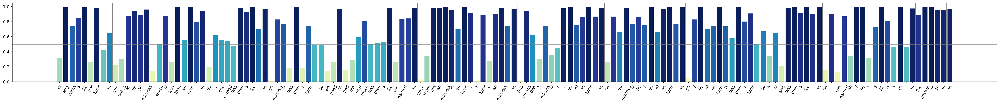

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 6: 
Weng earns $12 per hour.
She worked for 50 minutes.
She can work for 60 minutes in an hour.
Therefore, she worked for 50/60 = 5/6 of an hour.
She earned $12 for 5/6 of an hour so she earned $12 x 5/6 = $10.
The answer is 10



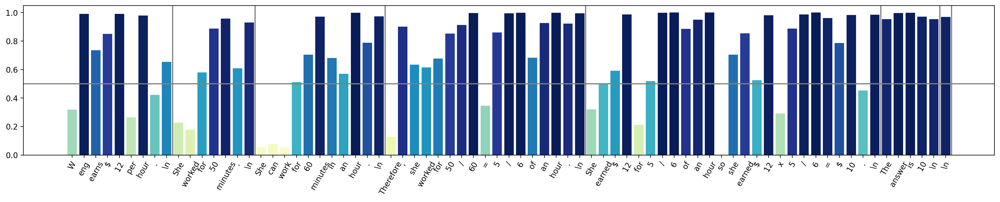

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 7: 
Weng earns $12 an hour.
She babysat for 50 minutes.
So she earned $12 for 50/60 = 5/6 of an hour.
She earned $12 * 5/6 = $10.
The answer is 10



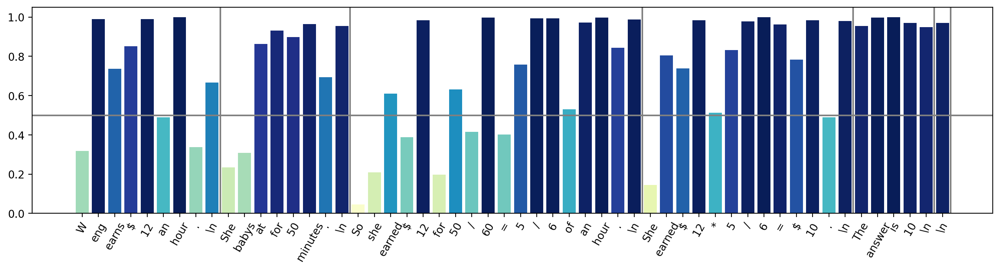

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 8: 
If Weng earns $12 an hour, then she earns $12/60 = $0.20 per minute.
If she worked for 50 minutes, then she earned 50 * $0.20 = $10
The answer is 10



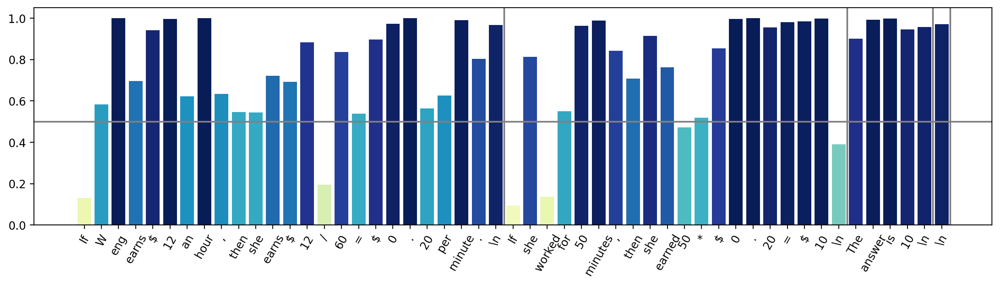

Question 1: Weng earns $12 an hour for babysitting. Yesterday, she just did 50 minutes of babysitting. How much did she earn?

Answer: Weng earns 12/60 = $<<12/60=0.2>>0.2 per minute.
Working 50 minutes, she earned 0.2 x 50 = $<<0.2*50=10>>10.
#### 10

Model output 9: 
Weng earns $12 an hour.
She did 50 minutes of babysitting.
Since there are 60 minutes in an hour, 50 minutes is 50/60 = 5/6 of an hour.
She earned $12 * 5/6 = $10.
The answer is 10



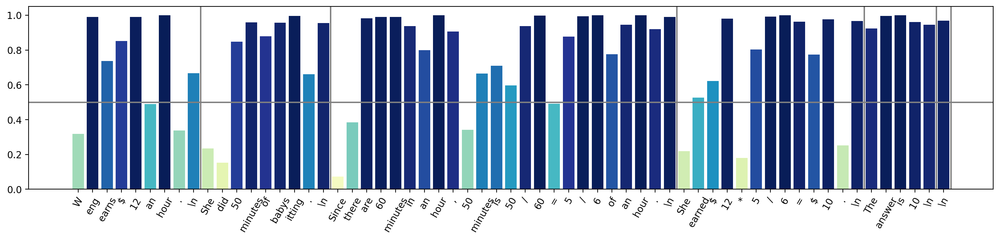

In [157]:
for i in range(10):
    vis_prob_flow(questions, answers, ans_pred, per_step_prob, 1, i)

# Flan-T5 Draw Per-Token Heatmap

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 2:  In May, Natalia sold 48 / 2 = 24 clips. In April and May combined, Natalia sold 48 + 24 = 72 clips. The answer is 72</s>


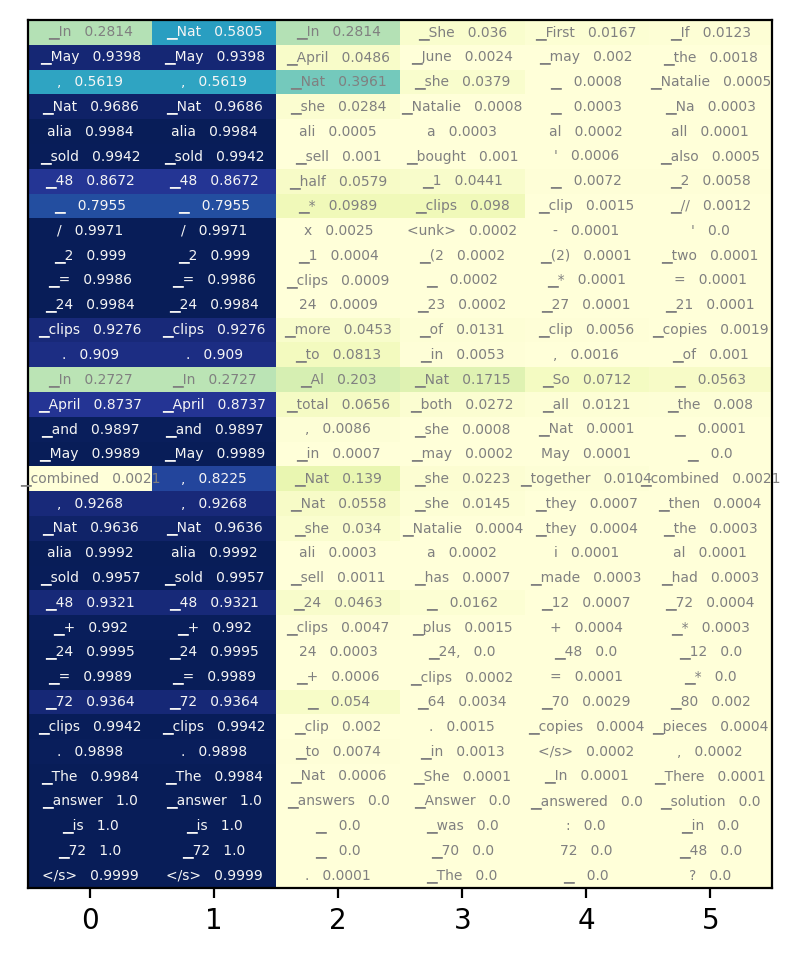

In [80]:
visualize(questions_flan, answers_flan, ans_pred_flan, per_step_prob_flan, 0, 2)

# Flan-T5 Draw Probability Flow

## Correct Case 1

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 0:  In May she sold 48 / 2 = 24 more clips. Natalia sold 48 + 24 = 72 clips altogether in April and May. The answer is 72</s>


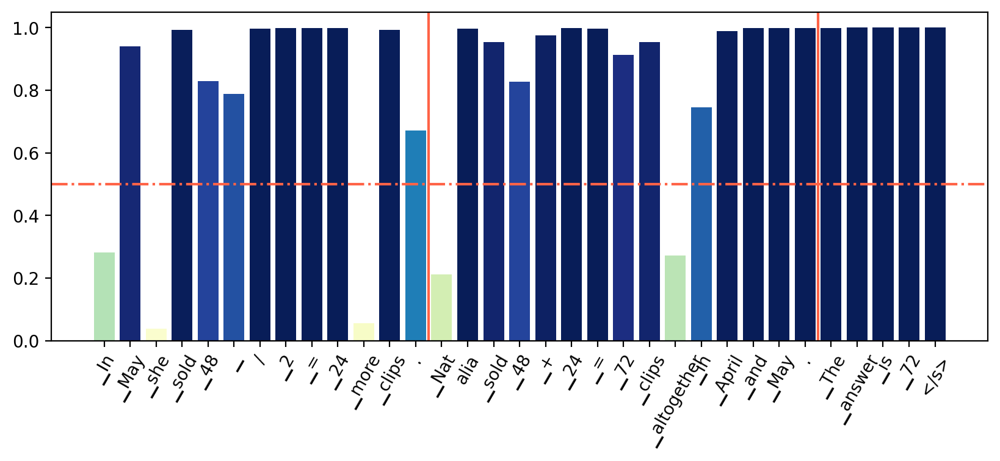

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 1:  Natalia sold 48 / 2 = 24 clips in May. In April and May, Natalia sold 48 + 24 = 72 clips. The answer is 72</s>


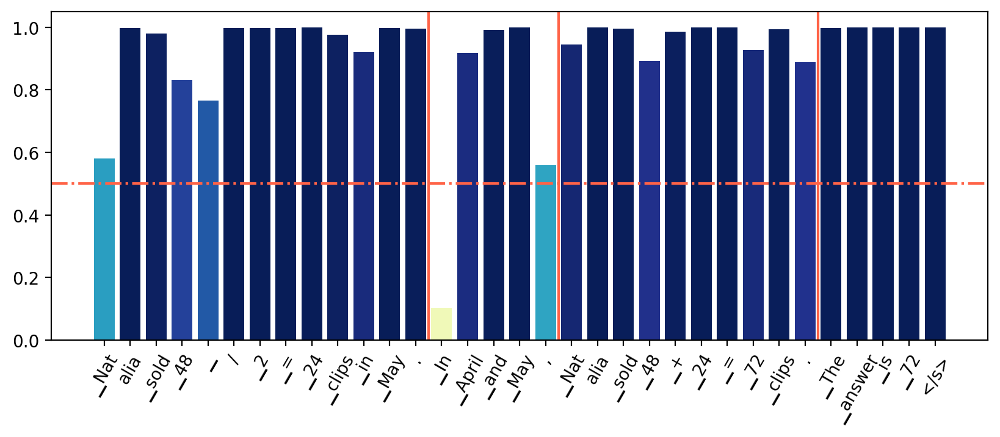

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 2:  In May, Natalia sold 48 / 2 = 24 clips. In April and May combined, Natalia sold 48 + 24 = 72 clips. The answer is 72</s>


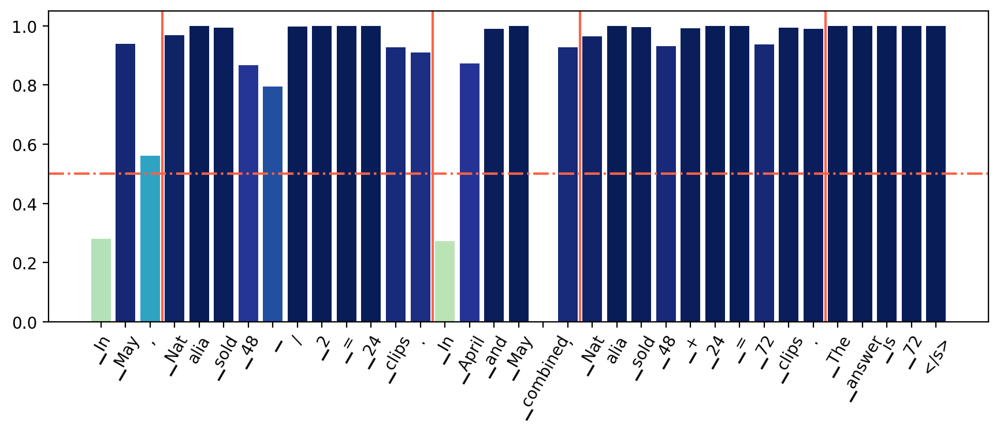

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 3:  To find out how many clips Natalia sold in May, we first need to know how many clips she sold in April: 48 friends * 1 / 2 = 24 friends. The answer is 24.</s>


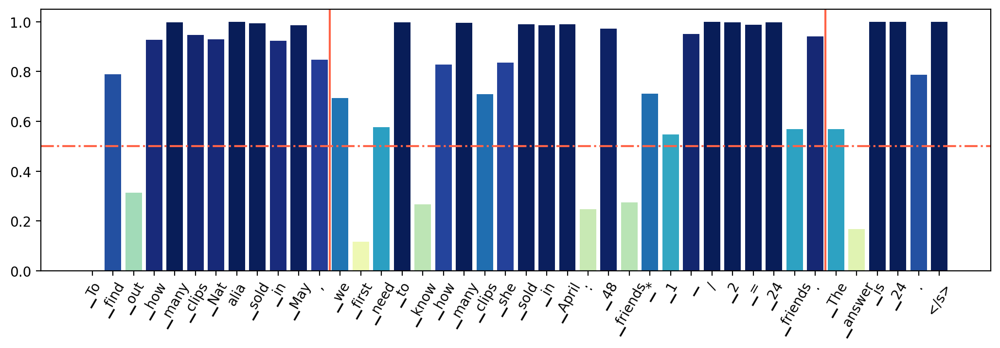

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 4:  In May she sold 48 / 2 = 24 clips. Therefore Natalia sold 48 + 24 = 72 clips in April and May. The answer is 72</s>


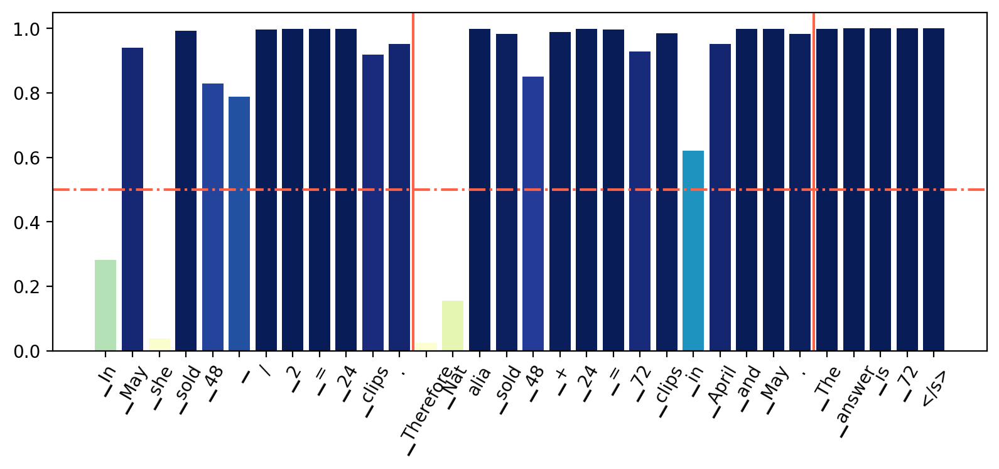

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 5:  Natalia sold 48 / 2 = 24 clips in May. The total number of clips she sold in April and May is 48 + 24 = 72 clips. The answer is 72</s>


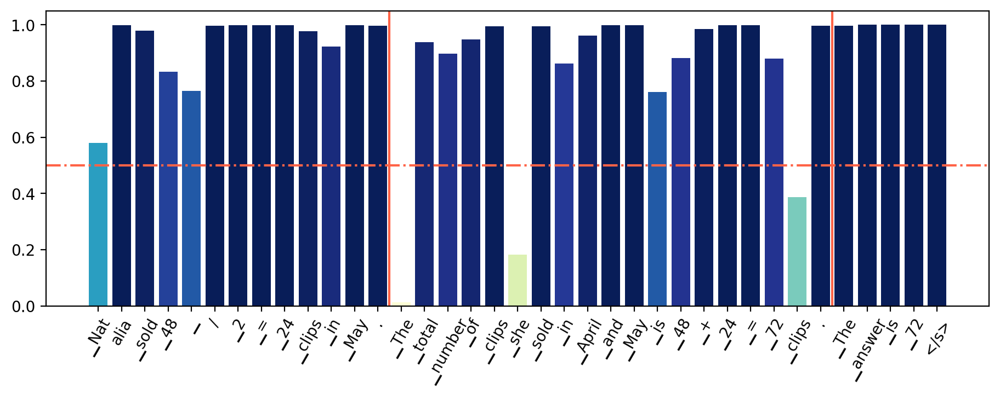

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 6:  To get an idea of how many clips Natalia sold altogether in April and May, we must first calculate the number of clips Natalia sold in May: 48 clips / 2 = 24 clips. Since 48 clips represent a total of 24 clips sold, 28 clips are the actual number Natalia sold in May. The total number of clips Natalia sold in April and May, then, is 28 clips + 48 clips = 64 clips. The answer is 64</s>


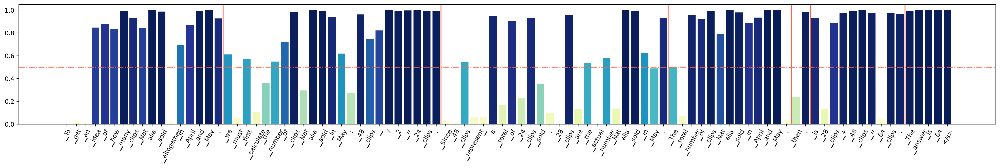

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 7:  She sold 48 / 2 = 24 clips in May. That means she sold 48 + 24 = 72 clips altogether in April and May. The answer is 72</s>


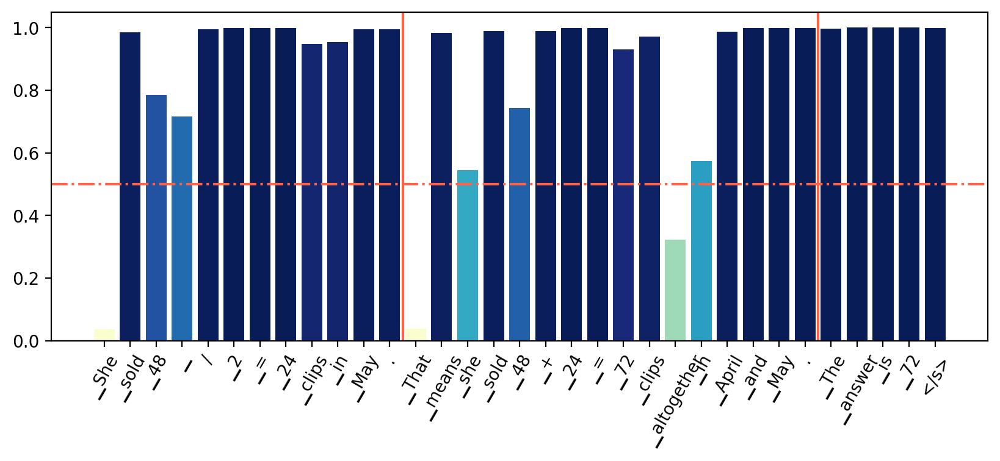

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 8:  In May, Natalia sold 48 / 2 = 24 clips. Together, in April and May Natalia sold 48 + 24 = 72 clips. The answer is 72</s>


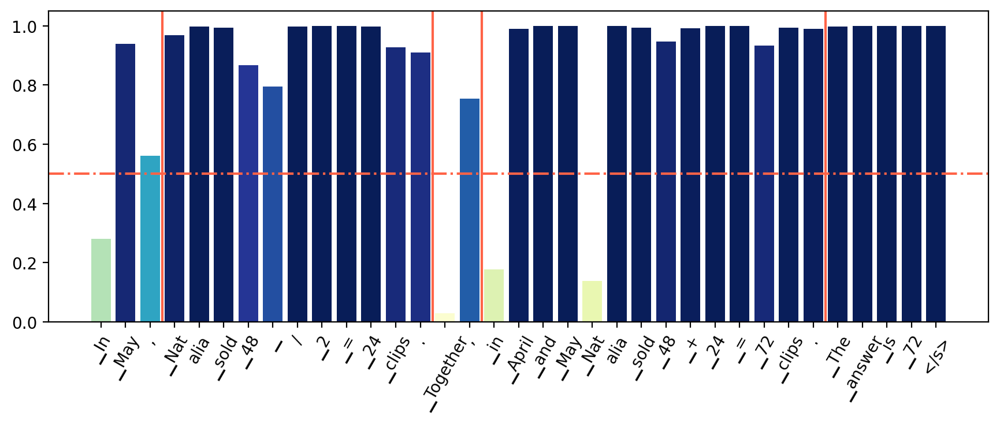

Question 0: Natalia sold clips to 48 of her friends in April, and then she sold half as many clips in May. How many clips did Natalia sell altogether in April and May?

Answer: Natalia sold 48/2 = <<48/2=24>>24 clips in May.
Natalia sold 48+24 = <<48+24=72>>72 clips altogether in April and May.
#### 72

Model output 9:  Natalia sold half as many clips in May, which means a total of 48 / 2 = 24 clips in May. Altogether, Natalia sold 48 + 24 = 72 clips between April and May. The answer is 72</s>


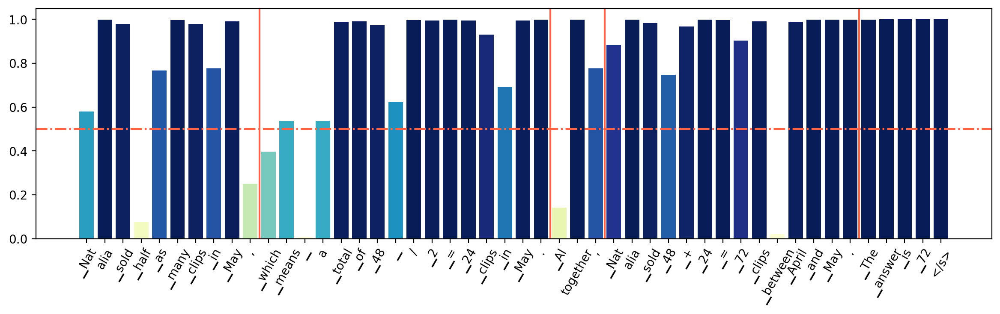

In [84]:
for i in range(10):
    vis_prob_flow(questions_flan, answers_flan, ans_pred_flan, per_step_prob_flan, 0, i)

## Wrong Case 1

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 0:  The fabric and jewelry departments make a third of the sales, and the stationery department make a quarter of the sales, 36 / 3 / 4 + 12 / 4 = 15 / 3 sales a day. Out of 360 sales, there were 360 / 8 / 6 = 360 sales that did not make it to the fabric section or the jewelry section. Since the store has 360 total sales, today they made 360 - 360 - 360 - 360 - 360 = 120 stationery sales. The answer is 120</s>


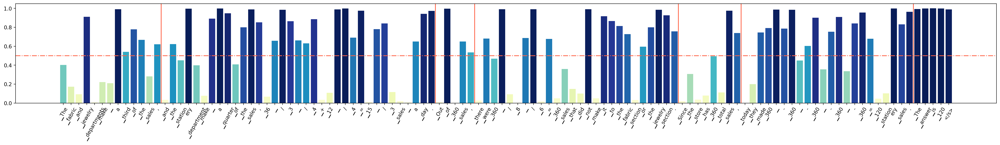

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 1:  A third of the shop's sales are in the fabric section, and a quarter of the total shop sales are in the jewelry section, so they make 3 / 3 * 36 = 12 sales in the fabric section today. A quarter of all sales are in the jewelry section, so they made 12 * 1 / 4 = 3 sales in the jewelry section today. Thus, 24 - 3 - 12 = 18 sales were in the stationery section today. The answer is 18.</s>


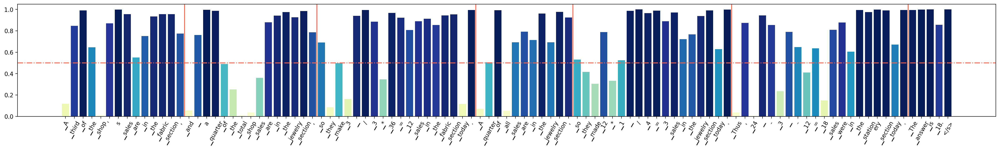

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 2:  We know that the fabric section makes 36 / 3 = 12 sales today. We know that the jewelry section makes 36 / 4 = 9 sales today. Therefore, 36 - 12 - 9 = 3 sales were in the stationery section. The answer is 3.</s>


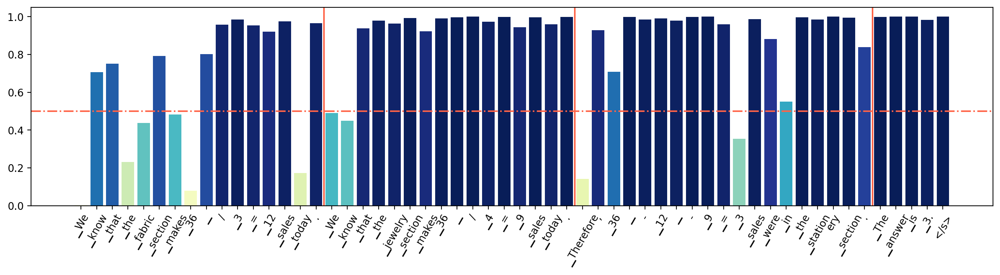

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 3:  One third of the store's sales are in fabrics, so they had 36 sales / 3 = 12 sales in the fabric section. A quarter of the store's sales are in jewelry, so they had 36 sales / 4 = 9 sales in the jewelry section. The other 36 sales were in stationery, so 36 sales - 12 sales - 9 sales = 12 sales were stationery. The answer is 12</s>


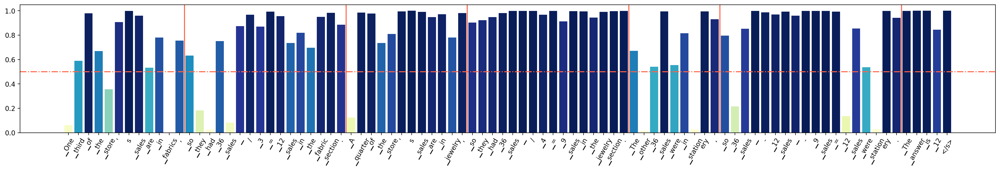

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 4:  The craft store makes 36 / 3 = 12 sales in the fabric section. They make 36 / 4 = 9 sales in the jewelry section. A craft store makes 12 + 9 = 27 sales in the stationery section. When you subtract 27 from the total number of sales, you arrive at 36 - 27 = 5 sales sold in the stationery section. The answer is 5.</s>


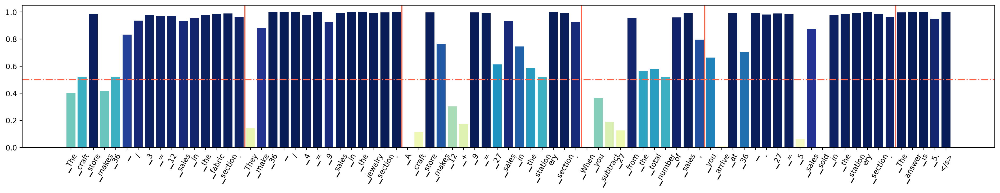

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 5:  The craft store makes a third of its sales in the fabric section, so that's 1 / 3 * 36 = 12 sales. A quarter of its sales are in the jewelry section, so that's 1 / 4 * 36 = 9 sales. The rest are made in the stationery section, 12 - 9 - 3 = 7. The answer is 7.</s>


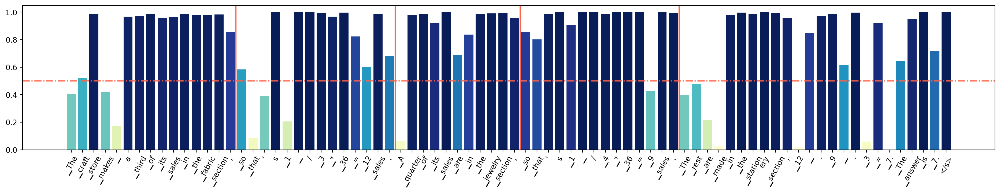

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 6:  The craft stores total sales are 36 / 3 = 12. A quarter of the craft stores sales are 12 / 4 = 3 today. So the craft store made 36 - 6 = 18 stationery sales on today. The answer is 18.</s>


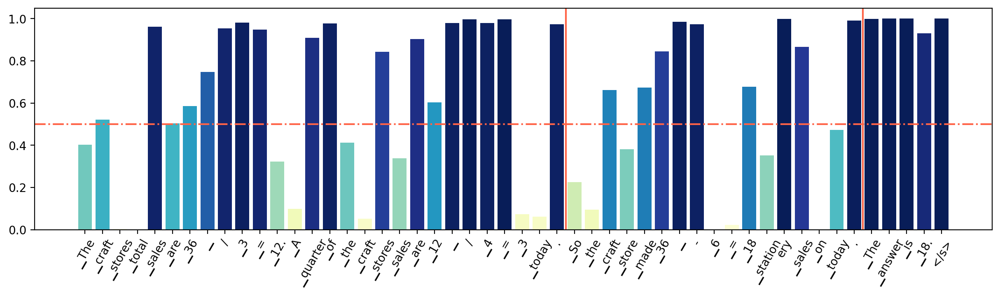

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 7:  A third of the stores sales are from the fabric section, so the craft store makes 36 x 1 / 3 = 12 sales from the fabric section. A quarter of all the sales are in the jewelry section so that is 12 x 1/4 = 3 sales. So, a quarter of the craft shops sales are from the stationery section, so this is 36 - 12 - 3 = 6 sales. The answer is 6</s>


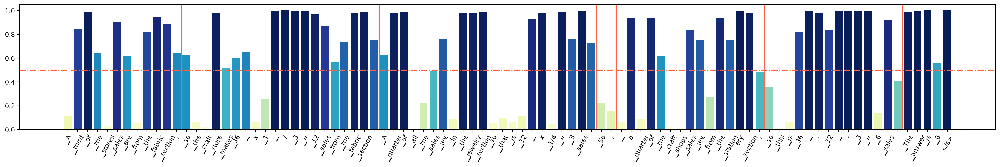

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 8:  A third of the sales were in the stationery section because 36 / (3) = 36. A quarter of the sales were in the jewelry section because 36 / (2 / 3) = 6. The fabric section made a third of those sales because 36 / (3/ 4) = 12. The jewelry section made a quarter of those sales because 12 / (2 / 3) = 4. The fabric section made one third of their sales in the stationery section so 36 - 12 - 4 = 36 stationery sales. The answer is 36</s>


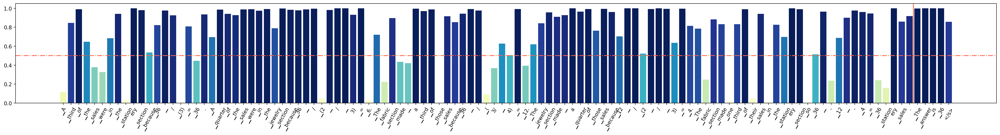

Question 100: A craft store makes a third of its sales in the fabric section, a quarter of its sales in the jewelry section, and the rest in the stationery section. They made 36 sales today. How many sales were in the stationery section?

Answer: The craft store made 36 / 3 = <<36/3=12>>12 sales in the fabric section.
It made 36 / 4 = <<36/4=9>>9 sales in the jewelry section.
Thus, there were 36 - 12 - 9 = <<36-12-9=15>>15 sales in the stationery section.
#### 15

Model output 9:  The stationery section makes 36 - a - third of its sales = 12 third of its sales. The jewelry section makes 36 - 12 / 3 = 8 sales. The total of fabric and jewelery sales is 36 - 8 = 21. So the stationery section made 36 - 21 = 9 sales. The answer is 9</s>


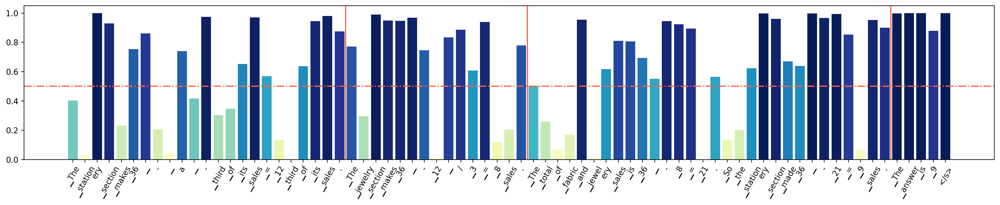

In [85]:
for i in range(10):
    vis_prob_flow(questions_flan, answers_flan, ans_pred_flan, per_step_prob_flan, 100, i)

# Align Codex tokens to Flan-T5 tokenizers